Image Denoising using: 

In [193]:
from sklearn import metrics
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
#import tensorflow as tf
import cv2
#from tensorflow.keras.datasets import mnist
from numpy.fft import fft2, ifft2
from scipy.signal import gaussian, convolve2d
from scipy import ndimage, misc
import matplotlib.pyplot as plt
import matplotlib.image as img
import skimage
from skimage.restoration import denoise_tv_chambolle, denoise_bilateral, denoise_nl_means, estimate_sigma
from skimage import data, img_as_float
from skimage import measure
from skimage import util 
from copy import deepcopy
import random

In [194]:
# Image Plotting function
def plot_func(images, saveimage, x=1,y=6, cmap='gray', savename='',r=20,c=3):
    plt.figure(figsize=(r,c))
    for i in range(len(images)):
        ax = plt.subplot(x,y,i+1)
        plt.imshow(images[i], cmap = 'gray')
        
    if(saveimage==True):
        plt.savefig(savename, bbox_inches='tight', format = 'png', dpi=30)

The shape of loaded image database is  (5, 512, 512)


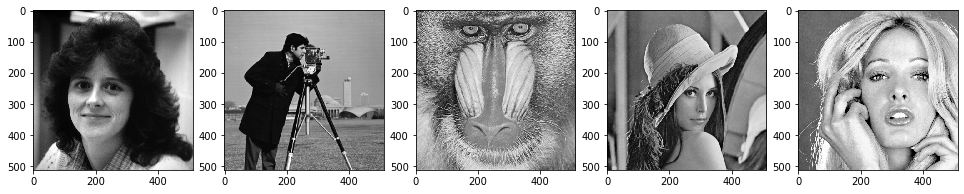

In [195]:
# Creating database of test images

imagenames = ["woman_darkhair.tif","cameraman.tif", "mandril_gray.tif", "lena_gray_512.tif", "woman_blonde.tif" ]
images = []

for i in range(len(imagenames)):
    images.append(img.imread('standard_test_images/' + imagenames[i]))
images = np.array(images)

# Plot images
plot_func(images, saveimage=True, savename='Original_images.png',x=1,y=6)

print("The shape of loaded image database is ",images.shape)

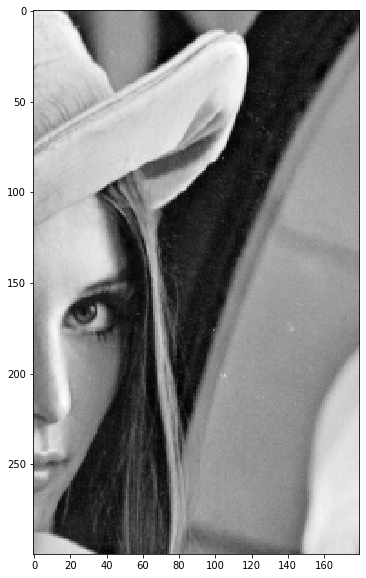

In [196]:
#Cropping Lena i = 3
x = images[3]
x = x[100:400, 300:480]
x.shape
x = np.array([x])
plot_func(x,saveimage=True,savename='lena_orig_corpped.png',x=1,y=1, r=10, c=10)

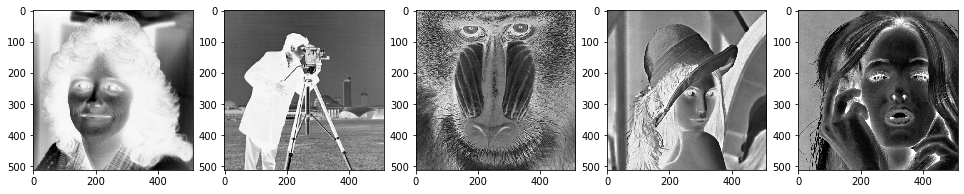

In [197]:
# Inverted the images in order to make Poisson noise more visible

images_inv = util.invert(images)

# Printing and saving inverted images
plot_func(images_inv, saveimage=True, savename='Inverted_images.png', x=1,y=6)


# METRICS

In [198]:
# PSNR = Peak Signal to Noise Ratio
def psnr(im1, im2):
    mse = np.mean((im1-im2)**2)
    if mse == 0:
        return 100
    return 20 * np.log10(255 / np.sqrt(mse))

# To calculate SSIM, python's library function call " " will be used

# DIFFERENT NOISE TYPES

# a) Gaussian Noise

In [199]:
def gaussian_noise(image,mean,variance):
    img_noisy = image +  0.5 * np.random.normal(loc=mean, scale=variance, size = image.shape)
    return img_noisy

# b) Poisson Noise

In [200]:
def poisson(image):
    noise = np.random.poisson(image)
    return noise

# c) Salt and Pepper Noise

In [201]:
# Creating function for salt and paper noise

def sp_noise(x_img,prob):
    x_noise = np.zeros(x_img.shape,np.uint8)
    thres = 1 - prob 
    for i in range(x_img.shape[0]):
        for j in range(x_img.shape[1]):
            rdn = random.random()
            if rdn < prob:
                x_noise[i][j] = 0
            elif rdn > thres:
                x_noise[i][j] = 255
            else:
                x_noise[i][j] = x_img[i][j]
    return x_noise

In [202]:
"""def bilateral(x_noisy):
    denoise_bilateral(noisy, sigma_range=0.1, sigma_spatial=15)"""

'def bilateral(x_noisy):\n    denoise_bilateral(noisy, sigma_range=0.1, sigma_spatial=15)'

# FILTERS

## a) Weiner Filter

In [203]:
def wiener_filter(img, kernel, K):
    kernel /= np.sum(kernel)
    dummy = np.copy(img)
    dummy = fft2(dummy, axes = (-2, -1))
    kernel = fft2(kernel, s = img.shape)
    kernel = np.conj(kernel) / (np.abs(kernel) ** 2 + K)
    dummy = dummy * kernel
    dummy = np.abs(ifft2(dummy))
    return dummy

def gaussian_kernel(kernel_size = 3):
    h = gaussian(kernel_size, kernel_size / 3).reshape(kernel_size, 1)
    h = np.dot(h, h.transpose())
    h /= np.sum(h)
    return h

## b) Bilateral Filter 

In [204]:
def bilateral_filter(images_noisy, sigma_spat=1):
    x_filt_bilG = np.zeros(images_noisy.shape)

    #plt.figure(figsize = (20,3))
    for i in range (len(images)):
        #x_noise_G[i] = img_as_float(x_noise_G[i])
        x_filt_bilG[i] = denoise_bilateral(images_noisy[i],  sigma_spatial = sigma_spat)
        #x = plt.subplot(1,6,i+1)
        #plt.imshow(x_filt_bilG[i], cmap = 'gray')

    #plt.savefig("Bilateral Filter + Gaussian Noise.png", bbox_inches = 'tight', format = 'png')
    return x_filt_bilG

# Creating Images with Noise


## a) Gaussian Noise 

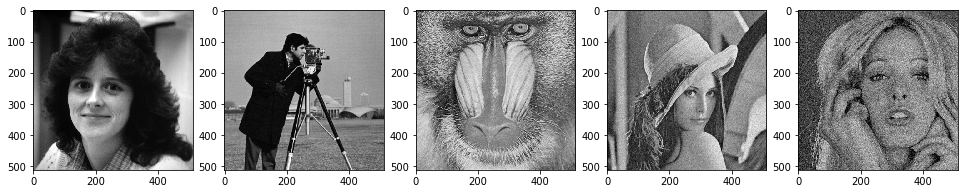

In [205]:
# Creating noisy images by adding Gaussian noise with variance 5, 10, 20 and 50

images_noisy_G = []

var = [0, 5, 10, 20, 50] 
#var = [0, 0.05, 0.1, 0.15, 0.2]
for i in range(len(images)):
    images_noisy_G.append(np.abs(gaussian_noise(images[i], mean=0.0, variance=var[i])))
images_noisy_G = np.array(images_noisy_G)    

plot_func(images_noisy_G, saveimage=True, savename='Images_gaussian_noise.png',x=1,y=6)

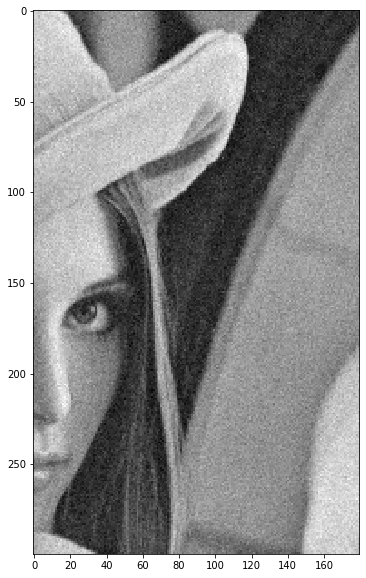

In [206]:
#Cropping Lena i = 3
x_G = images_noisy_G[3]
x_G = x_G[100:400, 300:480]
x_G.shape
x_G = np.array([x_G])
plot_func(x_G,saveimage=True,savename='lena_G_corpped.png',x=1,y=1, r=10, c=10)

##  b) Poisson Noise

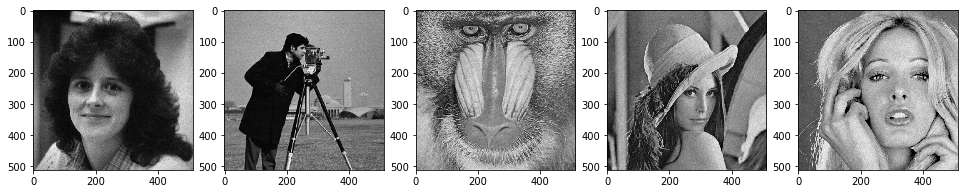

In [207]:
# Adding Poisson noise to the clean images

noise_mask = np.zeros(images.shape)
images_noise_P = np.zeros(images.shape)

#plt.figure(figsize = (20,3))
for i in range (len(images)):
    noise_mask = poisson(images[i])
    images_noise_P[i] = images[i] + noise_mask
    
plot_func(images_noise_P, saveimage=True, savename='poison_noise_image.png', x=1, y=6)

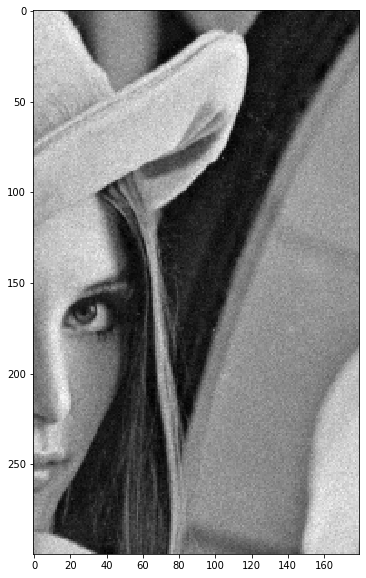

In [208]:
#Cropping Lena i = 3
x_P = images_noise_P[3]
x_P = x_P[100:400, 300:480]
x_P.shape
x_P = np.array([x_P])
plot_func(x_P,saveimage=True,savename='lena_P_corpped.png',x=1,y=1, r=10, c=10)

## c) Salt and Pepper Noise 

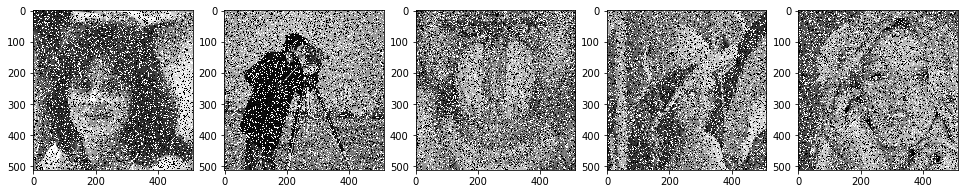

In [209]:
# Adding Salt and Pepper noise to images

images_noise_SnP = np.zeros(images.shape)
#plt.figure(figsize = (40,3))
for i in range (len(images)):
    images_noise_SnP[i] = sp_noise(images[i],0.15)

plot_func(images_noise_SnP, saveimage=True, savename='Saltandpeppernoise.png',x=1 , y=6)

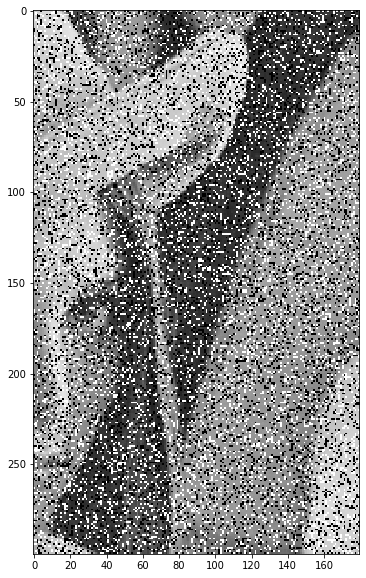

In [210]:
#Cropping Lena i = 3
x_SnP = images_noise_SnP[3]
x_SnP = x_SnP[100:400, 300:480]
x_SnP.shape
x_SnP = np.array([x_SnP])
plot_func(x_SnP,saveimage=True,savename='lena_SnP_corpped.png',x=1,y=1, r=10, c=10)

# WEINER FILTER

Here we'll be using a tupe of Spatial Linear Filtering Techniques: Weiner Filter (that does filtering in frequency domain)

## a) Filtering Gaussian Noise

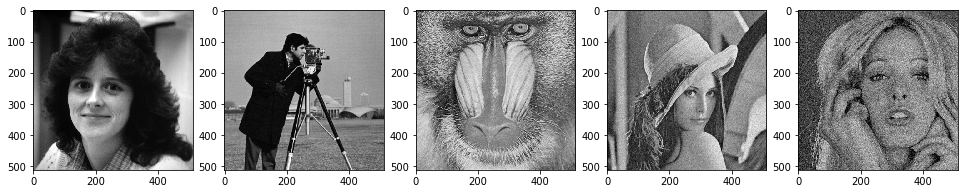

In [211]:
# Plotting images with Gaussian Noise
plot_func(images_noisy_G, saveimage=False,x=1,y=6)

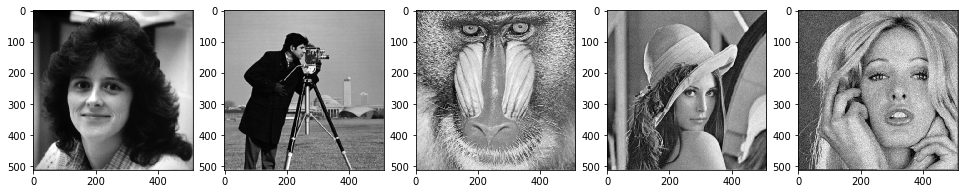

In [212]:
# Filtering with Weiner filter

images_filt_weinG = np.zeros(images_noisy_G.shape)
kernel = gaussian_kernel(3)

for i in range (len(images)):
    images_filt_weinG[i] = wiener_filter(images_noisy_G[i], kernel, K = 20)

plot_func(images_filt_weinG, saveimage=True, savename='wein_filtered_gaussian.png',x=1,y=6)

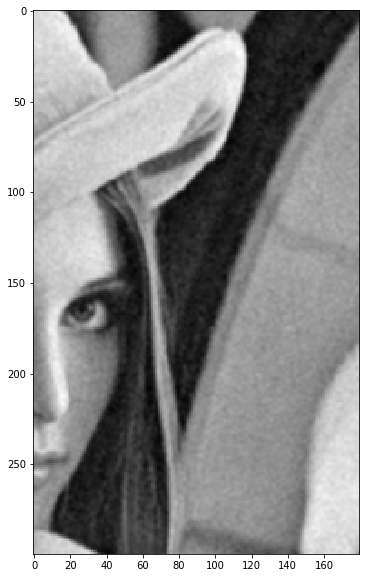

In [213]:
#Cropping Lena i = 3
x_filt_weinG = images_filt_weinG[3]
x_filt_weinG = x_filt_weinG[100:400, 300:480]
x_filt_weinG.shape
x_filt_weinG = np.array([x_filt_weinG])
plot_func(x_filt_weinG,saveimage=True,savename='lena_filt_weinG_corpped.png',x=1,y=1, r=10, c=10)

In [272]:
# Evaluating Weiner Filter Performance on Gaussian Noise images

print('Performance of Weiner Filter in gaussian Noise images-->')
ssim_weinG = 0
ssim_weinG_list = []
psnr_weinG_list = []
for i in range (len(images)):
    ssim_weinG = measure.compare_ssim(images_filt_weinG[i], images[i])#ssim_weinG = measure.compare_ssim(images_filt_weinG[i], images[i])
    ssim_weinG_list.append(ssim_weinG)
    #ssim_weinG_list.append(ssim_weinG)
    #ssim_wein +=ssim_wein
    #avg = ssim_wein/(len(x_img_5))
    psnr_weinG = measure.compare_psnr(images[i], images_filt_weinG[i]) 
    psnr_weinG_list.append(psnr_weinG)
    
    print('For image ',i)
    print('SSIM: ',ssim_weinG)
    print('PSNR', psnr_weinG)
    

Performance of Weiner Filter in gaussian Noise images-->
For image  0
SSIM:  0.00574661265918889
PSNR 6.669570608981399
For image  1
SSIM:  0.0050766343866665625
PSNR 6.0367746776130895


C:\Users\sahil\anaconda3\lib\site-packages\ipykernel_launcher.py:8: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  
C:\Users\sahil\anaconda3\lib\site-packages\ipykernel_launcher.py:13: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
  del sys.path[0]


For image  2
SSIM:  0.004431682097445174
PSNR 5.971131996604695
For image  3
SSIM:  0.004596848627088752
PSNR 6.0774564021235005
For image  4
SSIM:  0.004004730164606521
PSNR 5.531240760030216


In [266]:
len(ssim_weinG_list)

5

## b) Filtering Poisson Noise

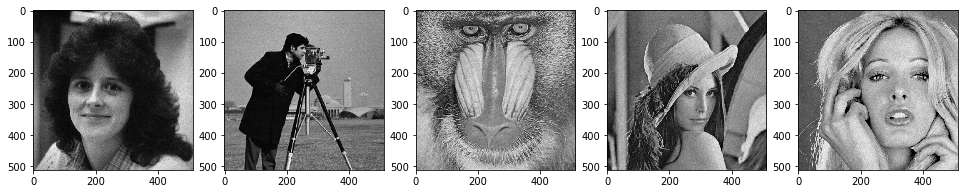

In [215]:
# Plotting images with Poisson Noise
plot_func(images_noise_P, saveimage=False, x=1, y=6)

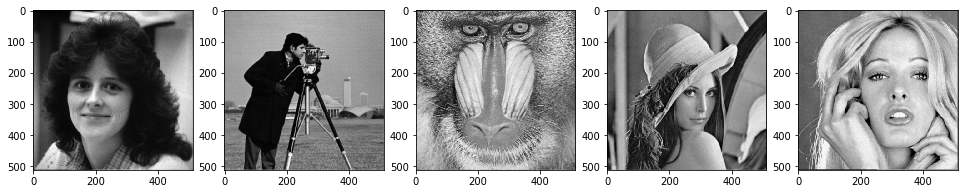

In [216]:
# Filtering Poisson noise using Weiner Filter

images_filt_weinP = np.zeros(images_noise_P.shape)
kernel = gaussian_kernel(3)

for i in range (len(images_noise_P)):
    images_filt_weinP[i] = wiener_filter(images_noise_P[i], kernel, K = 20)

plot_func(images_filt_weinP, saveimage=True, savename='WeinerFilter_poisson_noise.png',x=1, y=6)

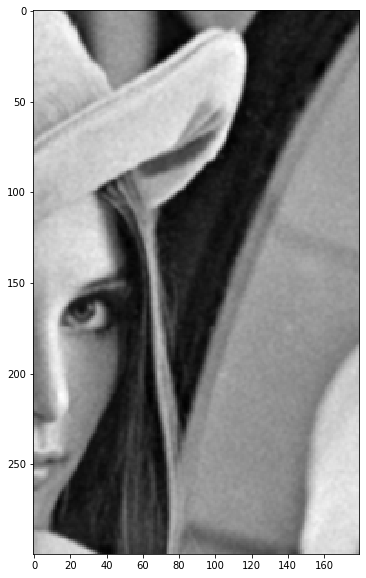

In [217]:
#Cropping Lena i = 3
x_filt_weinP = images_filt_weinP[3]
x_filt_weinP = x_filt_weinP[100:400, 300:480]
x_filt_weinP.shape
x_filt_weinP = np.array([x_filt_weinP])
plot_func(x_filt_weinP,saveimage=True,savename='lena_filt_weinP_corpped.png',x=1,y=1, r=10, c=10)

In [218]:
# Evaluating performance
print('Performance of Weiner Filter in Poisson Noise images-->')
ssim_weinP = 0
ssim_weinP_list=[]
psnr_weinP_list=[]

for i in range (len(images)):
    ssim_weinP = measure.compare_ssim(images_filt_weinP[i], images[i])
    ssim_weinP_list.append(ssim_weinP)
    #ssim_wein +=ssim_wein
    #avg = ssim_wein/(len(x_img_5))   
    psnr_weinP = measure.compare_psnr(images[i], images_filt_weinP[i]) 
    psnr_weinP_list.append(psnr_weinP)
    print('For', i, 'image')
    print('SSIM: ',ssim_weinP)
    print('PSNR: ',psnr_weinP)

Performance of Weiner Filter in Poisson Noise images-->
For 0 image
SSIM:  0.02240775416023618
PSNR:  7.113574512712418
For 1 image
SSIM:  0.019681374662911113
PSNR:  6.478039814089772


C:\Users\sahil\anaconda3\lib\site-packages\ipykernel_launcher.py:8: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  
C:\Users\sahil\anaconda3\lib\site-packages\ipykernel_launcher.py:12: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
  if sys.path[0] == '':


For 2 image
SSIM:  0.01755897248643376
PSNR:  6.409153202359055
For 3 image
SSIM:  0.018002226289366364
PSNR:  6.519337581014203
For 4 image
SSIM:  0.01577752632432005
PSNR:  5.972068253304763


## c) Filtering Salt and Pepper Noise

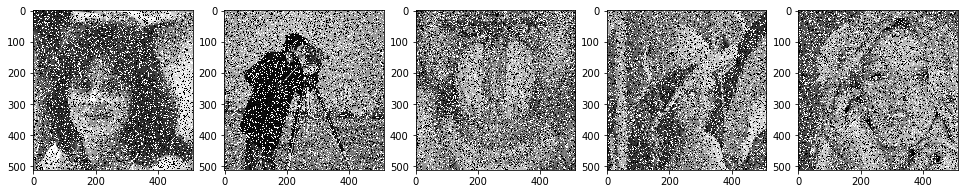

In [219]:
# Plotting images with Salt and Pepper Noise
plot_func(images_noise_SnP, saveimage=False,x=1 , y=6)

<Figure size 2880x216 with 0 Axes>

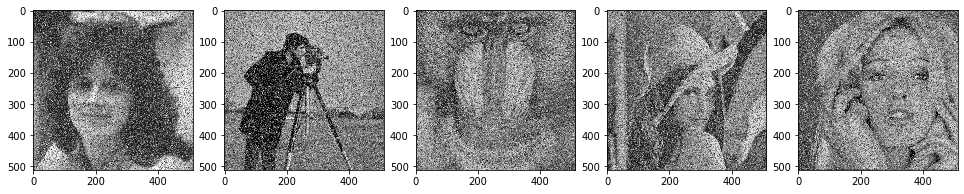

In [220]:
# Filtering Salt and Pepper noise using Weiner Filter

images_filt_weinSnP = np.zeros(images_noise_SnP.shape)
kernel = gaussian_kernel(2)
plt.figure(figsize = (40,3))
for i in range (len(images_noise_SnP)):
    images_filt_weinSnP[i] = wiener_filter(images_noise_SnP[i], kernel, K = 20)

plot_func(images_filt_weinSnP, saveimage=True, savename='Weinerfilter_snp.png',x=1,y=6)

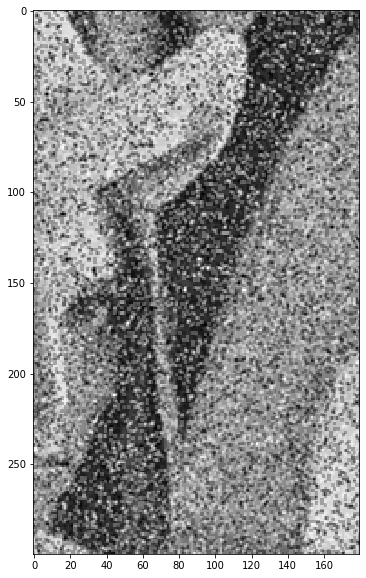

In [221]:
#Cropping Lena i = 3
x_filt_weinSnP = images_filt_weinSnP[3]
x_filt_weinSnP = x_filt_weinSnP[100:400, 300:480]
x_filt_weinSnP.shape
x_filt_weinSnP = np.array([x_filt_weinSnP])
plot_func(x_filt_weinSnP,saveimage=True,savename='lena_filt_weinSnP_corpped.png',x=1,y=1, r=10, c=10)

In [222]:
# Evaluating performance
print('Performance of Weiner Filter in Poisson Noise images-->')
ssim_weinSnP = 0
ssim_weinSnP_list=[]
psnr_weinSnP_list=[]

for i in range (len(images)):
    ssim_weinSnP = measure.compare_ssim(images_filt_weinSnP[i], images[i])
    ssim_weinSnP_list.append(ssim_weinSnP)
    #ssim_wein +=ssim_wein
    #avg = ssim_wein/(len(x_img_5))   
    psnr_weinSnP = measure.compare_psnr(images[i], images_filt_weinSnP[i]) 
    psnr_weinSnP_list.append(psnr_weinSnP)
    print('For', i, 'image')
    print('SSIM: ',ssim_weinSnP)
    print('PSNR: ', psnr_weinSnP)

Performance of Weiner Filter in Poisson Noise images-->
For 0 image
SSIM:  0.004442788233123076
PSNR:  6.6560946260091
For 1 image
SSIM:  0.0045108812285619675
PSNR:  6.018098229503611


C:\Users\sahil\anaconda3\lib\site-packages\ipykernel_launcher.py:8: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  
C:\Users\sahil\anaconda3\lib\site-packages\ipykernel_launcher.py:12: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
  if sys.path[0] == '':


For 2 image
SSIM:  0.004810305617266828
PSNR:  5.962104717296369
For 3 image
SSIM:  0.0040932118987032605
PSNR:  6.064853270257203
For 4 image
SSIM:  0.0037003707330986796
PSNR:  5.513824179373526


# Median Filter

## a) Filtering Gaussian Noise

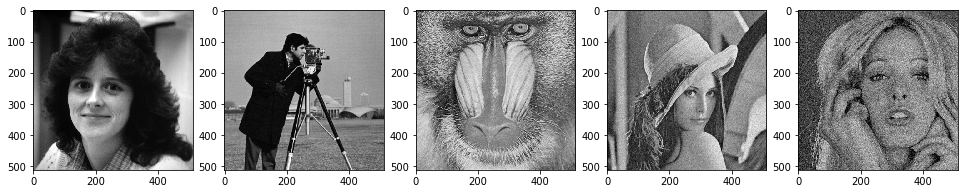

In [223]:
# Plotting images with Gaussian Noise
plot_func(images_noisy_G, saveimage=False,x=1,y=6)

<Figure size 1440x216 with 0 Axes>

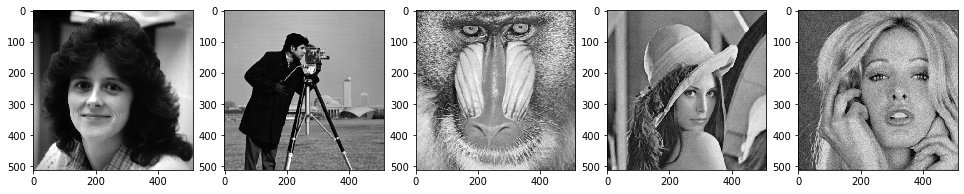

In [224]:
# Applying Median Filter to Gaussian Noise images

images_filt_medG = np.zeros(images_noisy_G.shape)

plt.figure(figsize = (20,3))
for i in range (len(images_noisy_G)):
    images_filt_medG[i] = ndimage.median_filter(images_noisy_G[i], 3)
    
plot_func(images_filt_medG, saveimage=True, savename='medfilter_gaussian.png', x=1, y=6)

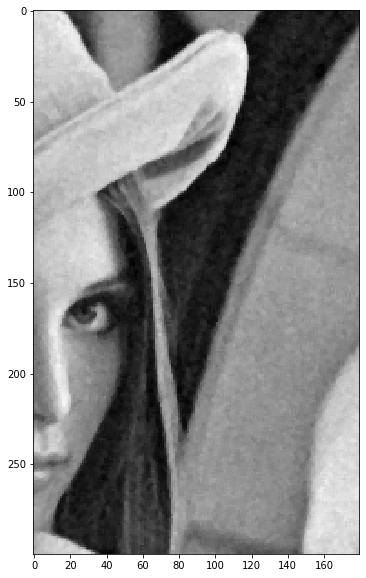

In [225]:
#Cropping Lena i = 3
x_filt_medG = images_filt_medG[3]
x_filt_medG = x_filt_medG[100:400, 300:480]
x_filt_medG.shape
x_filt_medG = np.array([x_filt_medG])
plot_func(x_filt_medG,saveimage=True,savename='lena_filt_medG_corpped.png',x=1,y=1, r=10, c=10)

In [226]:
# Evaluating performance
print('Performance of Median Filter in Gaussian Noise images -->')
ssim_medG = 0
ssim_medG_list=[]
psnr_medG_list=[]
for i in range (len(images)):
    ssim_medG = measure.compare_ssim(images_filt_medG[i], images[i])
    ssim_medG_list.append(ssim_medG)
    #ssim_wein +=ssim_wein
    #avg = ssim_wein/(len(x_img_5))   
    psnr_medG = measure.compare_psnr(images[i], images_filt_medG[i]) 
    psnr_medG_list.append(psnr_medG)
    print('For', i, 'image')
    print('SSIM: ',ssim_medG)
    print('PSNR: ', psnr_medG)

Performance of Median Filter in Gaussian Noise images -->
For 0 image
SSIM:  0.803789779266351
PSNR:  41.75246814779116
For 1 image
SSIM:  0.7610448566455286
PSNR:  36.48555208778856


C:\Users\sahil\anaconda3\lib\site-packages\ipykernel_launcher.py:7: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  import sys
C:\Users\sahil\anaconda3\lib\site-packages\ipykernel_launcher.py:11: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
  # This is added back by InteractiveShellApp.init_path()


For 2 image
SSIM:  0.8731320663635432
PSNR:  29.569739563737496
For 3 image
SSIM:  0.5732749607943085
PSNR:  32.190084347297116
For 4 image
SSIM:  0.38156779941746777
PSNR:  25.78188184017236


## b) Filtering Poisson Noise

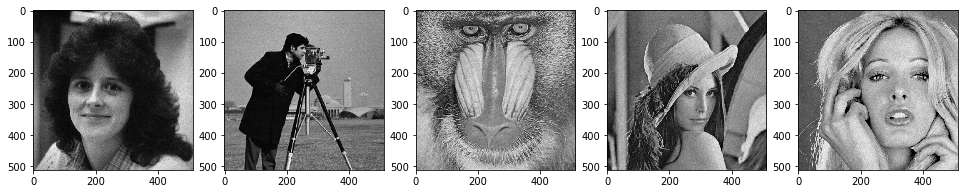

In [227]:
# Plotting images with Poisson Noise
plot_func(images_noise_P, saveimage=False, x=1, y=6)

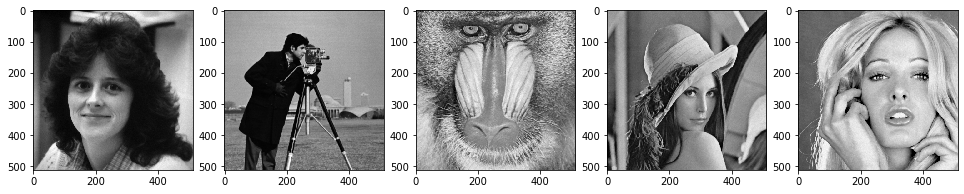

In [228]:
# Applying Median Filter to Poisson Noise images

images_filt_medP = np.zeros(images_noise_P.shape)

#plt.figure(figsize = (20,3))
for i in range (len(images_inv)):
    images_filt_medP[i] = ndimage.median_filter(images_noise_P[i], 3)
    
plot_func(images_filt_medP, saveimage=True, savename='medianfilter-poisson.png',x=1,y=6)

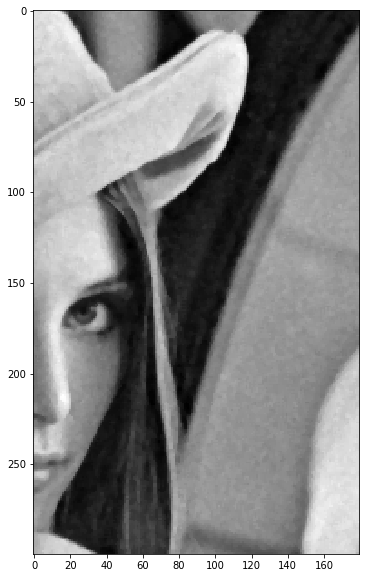

In [229]:
#Cropping Lena i = 3
x_filt_medP = images_filt_medP[3]
x_filt_medP = x_filt_medP[100:400, 300:480]
x_filt_medP.shape
x_filt_medP = np.array([x_filt_medP])
plot_func(x_filt_medP,saveimage=True,savename='lena_filt_medP_corpped.png',x=1,y=1, r=10, c=10)

In [230]:
# Evaluating performance

print('Performance of Median Filter in Poisson Noise images -->')
ssim_medP = 0
ssim_medP_list = []
psnr_medP_list = []
for i in range (len(images_inv)):
    ssim_medP = measure.compare_ssim(images_filt_medP[i], images[i])
    ssim_medP_list.append(ssim_medP)
    #ssim_wein +=ssim_wein
    #avg = ssim_wein/(len(x_img_5))  
    psnr_medP = measure.compare_psnr(images[i], images_filt_medP[i]) 
    psnr_medP_list.append(psnr_medP)
    print('For',i, 'image')
    print('SSIM: ',ssim_medP)
    print('PSNR: ', psnr_medP)

Performance of Median Filter in Poisson Noise images -->
For 0 image
SSIM:  0.43187987544374856
PSNR:  6.261768799967843
For

C:\Users\sahil\anaconda3\lib\site-packages\ipykernel_launcher.py:8: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  
C:\Users\sahil\anaconda3\lib\site-packages\ipykernel_launcher.py:12: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
  if sys.path[0] == '':


 1 image
SSIM:  0.41865349755795317
PSNR:  5.653960638477144
For 2 image
SSIM:  0.6402168339312415
PSNR:  5.623336823761153
For 3 image
SSIM:  0.4531429280173207
PSNR:  5.685479866387967
For 4 image
SSIM:  0.460747038222773
PSNR:  5.110001706620619


## c) Filtering Salt and Pepper noise

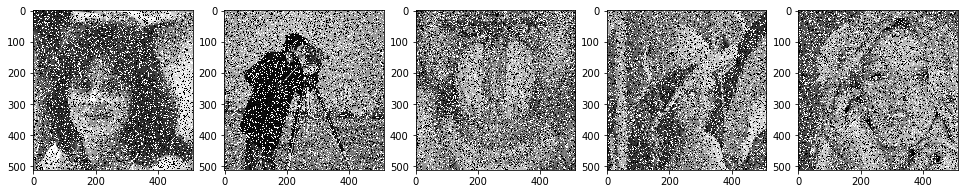

In [231]:
# Plotting images with Salt and Pepper Noise
plot_func(images_noise_SnP, saveimage=False,x=1 , y=6)

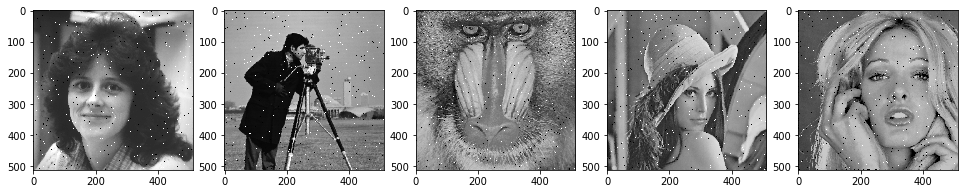

In [232]:
# Applying Median Filter to Poisson Noise images

images_filt_medSnP = np.zeros(images_noise_SnP.shape)

#plt.figure(figsize = (20,3))
for i in range (len(images)):
    images_filt_medSnP[i] = ndimage.median_filter(images_noise_SnP[i], 3)
    
plot_func(images_filt_medSnP, saveimage=True, savename='medianfilter_snpnoise.png', x=1, y=6)

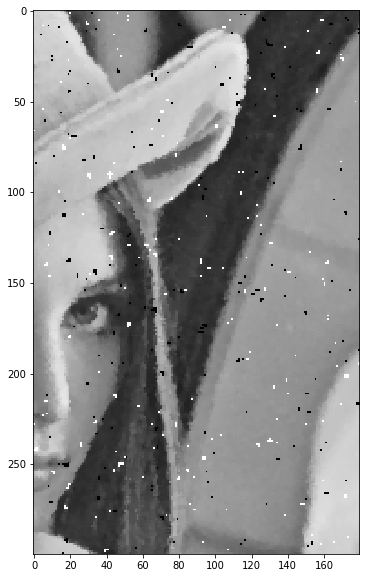

In [233]:
#Cropping Lena i = 3
x_filt_medSnP = images_filt_medSnP[3]
x_filt_medSnP = x_filt_medSnP[100:400, 300:480]
x_filt_medSnP.shape
x_filt_medSnP = np.array([x_filt_medSnP])
plot_func(x_filt_medSnP,saveimage=True,savename='lena_filt_medSnP_corpped.png',x=1,y=1, r=10, c=10)

In [234]:
# Evaluating performance

print('Performance of Median Filter in Poisson Noise images -->')
ssim_medSnP = 0
ssim_medSnP_list = []
psnr_medSnP_list = []
for i in range (len(images)):
    ssim_medSnP = measure.compare_ssim(images_filt_medSnP[i], images[i])
    ssim_medSnP_list.append(ssim_medSnP)
    #ssim_wein +=ssim_wein
    #avg = ssim_wein/(len(x_img_5))  
    psnr_medSnP = measure.compare_psnr(images[i],images_filt_medP[i]) 
    psnr_medSnP_list.append(psnr_medSnP)
    print('For',i, 'image')
    print('SSIM: ',ssim_medSnP)
    print('PSNR: ', psnr_medSnP)

Performance of Median Filter in Poisson Noise images -->
For 0 image
SSIM:  0.5811391620375476
PSNR:  6.261768799967843
For

C:\Users\sahil\anaconda3\lib\site-packages\ipykernel_launcher.py:8: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  
C:\Users\sahil\anaconda3\lib\site-packages\ipykernel_launcher.py:12: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
  if sys.path[0] == '':


 1 image
SSIM:  0.6259680135813342
PSNR:  5.653960638477144
For 2 image
SSIM:  0.6974140094940847
PSNR:  5.623336823761153
For 3 image
SSIM:  0.5524944190171341
PSNR:  5.685479866387967
For 4 image
SSIM:  0.5088071359064169
PSNR:  5.110001706620619


# Bilateral Filter

## a) Filtering Gaussian Noise 

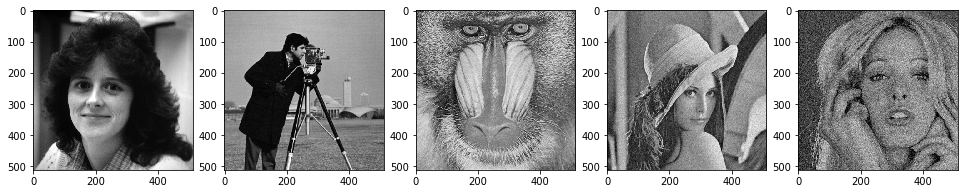

In [235]:
# Plotting images with Gaussian Noise
plot_func(images_noisy_G, saveimage=False,x=1,y=6)

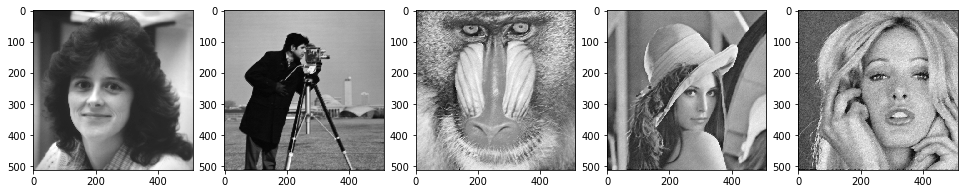

In [236]:
# Applying Bilateral Filter to Gaussian Noise images

"""x_filt_bilG = np.zeros(x_noise_G.shape)

plt.figure(figsize = (20,3))
for i in range (len(x_img_5)):
    #x_noise_G[i] = img_as_float(x_noise_G[i])
    x_filt_bilG[i] = denoise_bilateral(x_noise_G[i],  sigma_spatial = 1)
    x = plt.subplot(1,6,i+1)
    plt.imshow(x_filt_bilG[i], cmap = 'gray')
    
plt.savefig("Bilateral Filter + Gaussian Noise.png", bbox_inches = 'tight', format = 'png')"""

images_filt_bilG = bilateral_filter(images_noisy_G)

# Plotting filtered images
plot_func(images_filt_bilG, saveimage=True, savename='bilateral_gaussina.png', x=1,y=6)

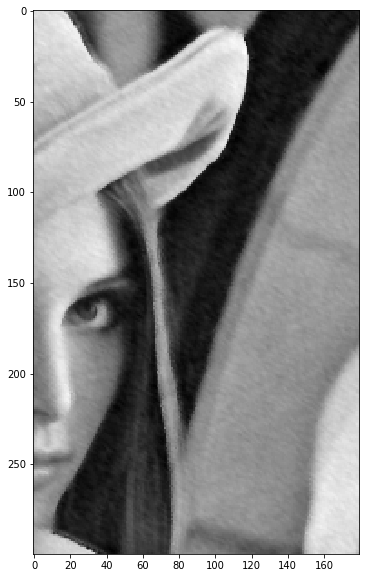

In [237]:
#Cropping Lena i = 3
x_filt_bilG = images_filt_bilG[3]
x_filt_bilG = x_filt_bilG[100:400, 300:480]
x_filt_bilG.shape
x_filt_bilG = np.array([x_filt_bilG])
plot_func(x_filt_bilG,saveimage=True,savename='lena_filt_bilG_corpped.png',x=1,y=1, r=10, c=10)

In [238]:
# Evaluating performance
print('Performance of Median Filter in Gaussian Noise images -->')
ssim_bilG = 0
ssim_bilG_list = []
psnr_bilG_list = []
for i in range (len(images)):
    ssim_bilG = measure.compare_ssim(images_filt_bilG[i], images[i])
    ssim_bilG_list.append(ssim_bilG)
    #ssim_wein +=ssim_wein
    #avg = ssim_wein/(len(x_img_5))   
    psnr_bilG = measure.compare_psnr(images[i], images_filt_bilG[i]) 
    psnr_bilG_list.append(psnr_bilG)
    print('For', i, 'image')
    print('SSIM: ',ssim_bilG)
    print('PSNR: ', psnr_bilG)

Performance of Median Filter in Gaussian Noise images -->
For 0 image
SSIM:  0.4791344893490041
PSNR:  30.056771736556346


C:\Users\sahil\anaconda3\lib\site-packages\ipykernel_launcher.py:7: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  import sys
C:\Users\sahil\anaconda3\lib\site-packages\ipykernel_launcher.py:11: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
  # This is added back by InteractiveShellApp.init_path()


For 1 image
SSIM:  0.2506460689526251
PSNR:  25.745032675238335
For 2 image
SSIM:  0.35673627896961146
PSNR:  22.771658097916777
For 3 image
SSIM:  0.43176187614889844
PSNR:  27.39546784739295
For 4 image
SSIM:  0.3615832520399791
PSNR:  25.41719417336964


## b) Filtering Poisson Noise

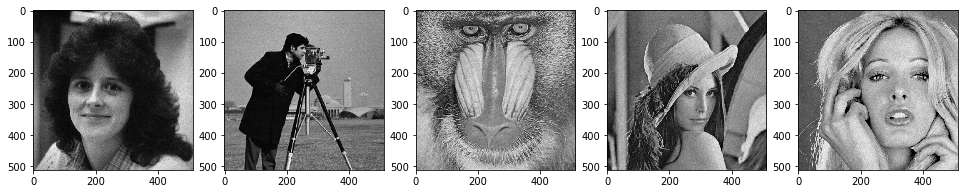

In [239]:
# Plotting images with Poisson Noise
plot_func(images_noise_P, saveimage=False, x=1, y=6)

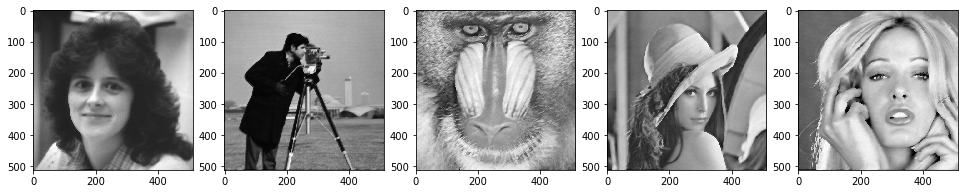

In [240]:
# Applying Median Filter to Poisson Noise images

images_filt_bilP = np.zeros(images.shape)

#plt.figure(figsize = (20,3))
for i in range (len(images)):
    #x_noise_G[i] = img_as_float(x_noise_G[i])
    images_filt_bilP[i] = denoise_bilateral(images_noise_P[i], sigma_spatial = 1.2)
    #x = plt.subplot(1,6,i+1)
    #plt.imshow(x_filt_bilP[i], cmap = 'gray')

#plt.savefig("Bilateral Filter + Poisson Noise.png", bbox_inches = 'tight', format = 'png')
plot_func(images_filt_bilP, saveimage=True, savename='Bilateralfilter_poisson.png',x=1, y=6)

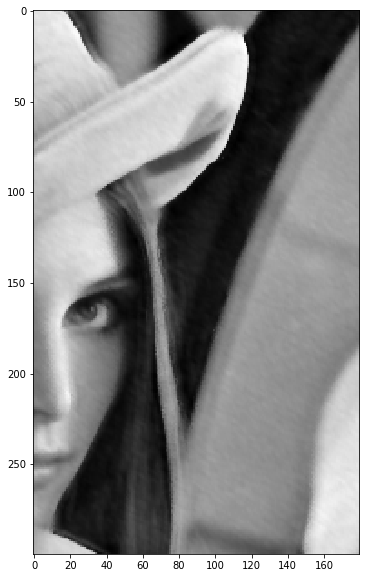

In [241]:
#Cropping Lena i = 3
x_filt_bilP = images_filt_bilP[3]
x_filt_bilP = x_filt_bilP[100:400, 300:480]
x_filt_bilP.shape
x_filt_bilP = np.array([x_filt_bilP])
plot_func(x_filt_bilP,saveimage=True,savename='lena_filt_bilP_corpped.png',x=1,y=1, r=10, c=10)

In [242]:
# Evaluating performance
print('Performance of Median Filter in Gaussian Noise images -->')
ssim_bilP = 0
ssim_bilP_list = []
psnr_bilP_list = []
for i in range (len(images)):
    ssim_bilP = measure.compare_ssim(images_filt_bilP[i], images[i])
    ssim_bilP_list.append(ssim_bilP)
    #ssim_wein +=ssim_wein
    #avg = ssim_wein/(len(x_img_5))   
    psnr_bilP = measure.compare_psnr(images[i], images_filt_bilP[i]) 
    psnr_bilP_list.append(psnr_bilP)
    print('For', i, 'image')
    print('SSIM: ',ssim_bilP)
    print('PSNR: ', psnr_bilP)

Performance of Median Filter in Gaussian Noise images -->
For 0 image
SSIM:  0.3052385251447814
PSNR:  6.286407153638155


C:\Users\sahil\anaconda3\lib\site-packages\ipykernel_launcher.py:7: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  import sys
C:\Users\sahil\anaconda3\lib\site-packages\ipykernel_launcher.py:11: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
  # This is added back by InteractiveShellApp.init_path()


For 1 image
SSIM:  0.16599137173717204
PSNR:  5.689665804141651
For 2 image
SSIM:  0.3131523511410012
PSNR:  5.564938191845815
For 3 image
SSIM:  0.3275603222804606
PSNR:  5.740000478554998
For 4 image
SSIM:  0.32915683275727836
PSNR:  5.141784313979452


## c) Filtering Salt and Pepper

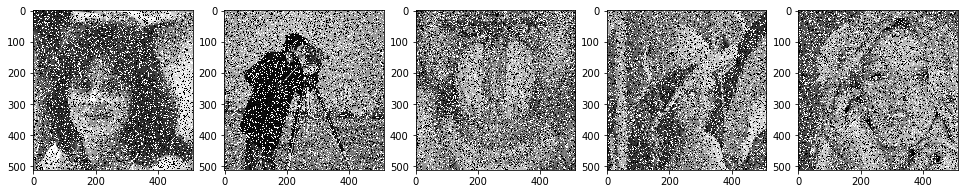

In [243]:
# Plotting images with Salt and Pepper Noise
plot_func(images_noise_SnP, saveimage=False,x=1 , y=6)

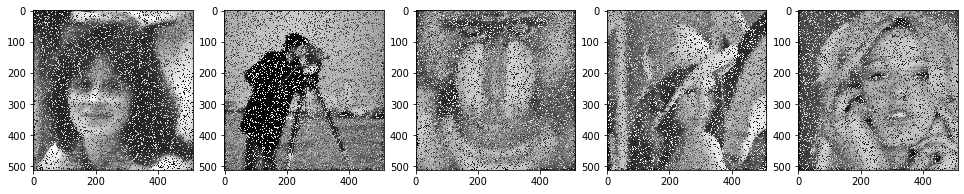

In [244]:
# Applying Bilateral Filter to Salt and Pepper Noise images

images_filt_bilSnP = np.zeros(images_noise_SnP.shape)

#plt.figure(figsize = (20,3))
for i in range (len(images)):
    images_filt_bilSnP[i] = denoise_bilateral(images_noise_SnP[i], sigma_spatial = 3)
    
plot_func(images_filt_bilSnP, saveimage=True, savename='bilateral_snp.png',x=1,y=6)

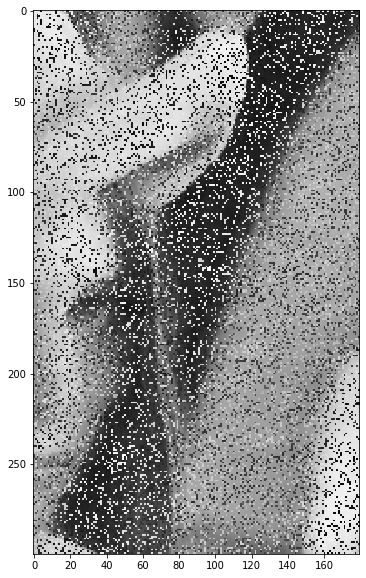

In [245]:
#Cropping Lena i = 3
x_filt_bilSnP = images_filt_bilSnP[3]
x_filt_bilSnP = x_filt_bilSnP[100:400, 300:480]
x_filt_bilSnP.shape
x_filt_bilSnP = np.array([x_filt_bilSnP])
plot_func(x_filt_bilSnP,saveimage=True,savename='lena_filt_bilSnP_corpped.png',x=1,y=1, r=10, c=10)

In [246]:
# Evaluating performance
print('Performance of Median Filter in Gaussian Noise images -->')
ssim_bilSnP = 0
ssim_bilSnP_list = []
psnr_bilSnP_list = []
for i in range (len(images)):
    ssim_bilSnP = measure.compare_ssim(images_filt_bilSnP[i], images[i])
    ssim_bilSnP_list.append(ssim_bilSnP)
    #ssim_wein +=ssim_wein
    #avg = ssim_wein/(len(x_img_5))   
    psnr_bilSnP = measure.compare_psnr(images[i], images_filt_bilSnP[i]) 
    psnr_bilSnP_list.append(psnr_bilSnP)
    print('For', i, 'image')
    print('SSIM: ',ssim_bilSnP)
    print('PSNR: ', psnr_bilSnP)

Performance of Median Filter in Gaussian Noise images -->
For 0 image
SSIM:  0.0384811235409088
PSNR:  13.65251734705672


C:\Users\sahil\anaconda3\lib\site-packages\ipykernel_launcher.py:7: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  import sys
C:\Users\sahil\anaconda3\lib\site-packages\ipykernel_launcher.py:11: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
  # This is added back by InteractiveShellApp.init_path()


For 1 image
SSIM:  0.06259697570268717
PSNR:  13.752236866427419
For 2 image
SSIM:  0.11084608175505
PSNR:  14.783036948885304
For 3 image
SSIM:  0.060540021288482904
PSNR:  14.490125476878209
For 4 image
SSIM:  0.06969841572712011
PSNR:  14.710794085520021


# Non- Local Means Filter

## a) Filtering Gaussian Noise 

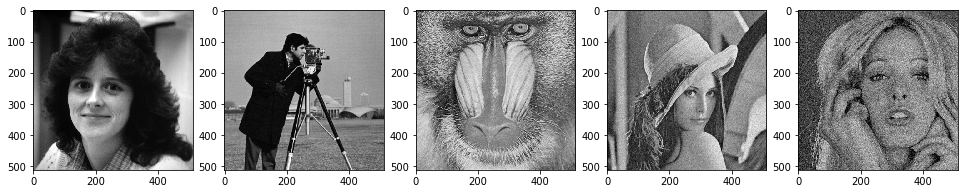

In [247]:
# Plotting images with Gaussian Noise
plot_func(images_noisy_G, saveimage=False,x=1,y=6)

Estimated noise standard deviation = { 7.154577035911624 }


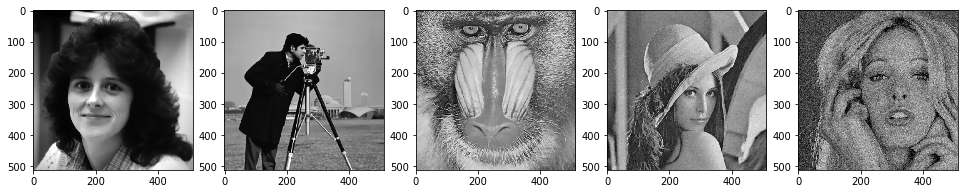

In [248]:
# Applying slow NLM to Gaussian Noise images

patch = dict(patch_size=5, patch_distance=6, multichannel=True) # 5x5 patches # 13x13 search area
# estimate the noise standard deviation from the noisy image
sigma_est = np.mean(estimate_sigma(images_noisy_G, multichannel=True))
print("Estimated noise standard deviation = {",sigma_est,"}")
images_filt_nlmG = np.zeros(images_noisy_G.shape)

#plt.figure(figsize = (20,3))
for i in range (len(images)):
    images_filt_nlmG[i] = denoise_nl_means(images_noisy_G[i], h=1.15 * sigma_est, fast_mode=False, **patch)

plot_func(images_filt_nlmG, saveimage=True, savename='NLMFilter-Gaussian.png', x=1, y=6)

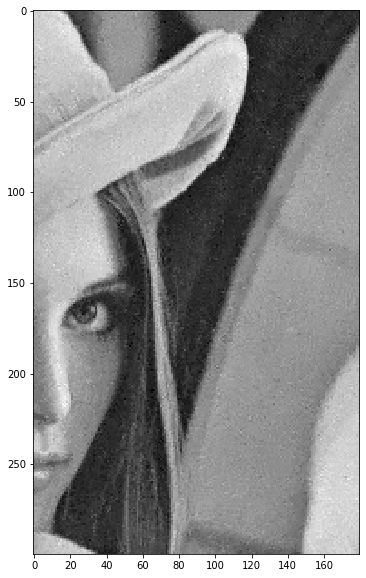

In [249]:
#Cropping Lena i = 3
x_filt_nlmG = images_filt_nlmG[3]
x_filt_nlmG = x_filt_nlmG[100:400, 300:480]
x_filt_nlmG.shape
x_filt_nlmG = np.array([x_filt_nlmG])
plot_func(x_filt_nlmG,saveimage=True,savename='lena_filt_nlmG_corpped.png',x=1,y=1, r=10, c=10)

In [250]:
# Evaluating performance of NLM on Gaussian noise images:

print('Performance of NLM Filter in Gaussian Noise images -->')
ssim_nlmG = 0
ssim_nlmG_list = []
psnr_nlmG_list = []

for i in range (len(images)):
    ssim_nlmG = measure.compare_ssim(images_filt_nlmG[i], images[i])
    ssim_nlmG_list.append(ssim_nlmG)
    #ssim_wein +=ssim_wein
    #avg = ssim_wein/(len(x_img_5))   
    psnr_nlmG = measure.compare_psnr(images[i], images_filt_nlmG[i]) 
    psnr_nlmG_list.append(psnr_nlmG)
    print('For', i, 'image')
    print('SSIM: ',ssim_nlmG)
    print('PSNR: ', psnr_nlmG)

Performance of NLM Filter in Gaussian Noise images -->
For 0 image
SSIM:  0.6558567926906526
PSNR:  40.788860005818144


C:\Users\sahil\anaconda3\lib\site-packages\ipykernel_launcher.py:9: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  if __name__ == '__main__':
C:\Users\sahil\anaconda3\lib\site-packages\ipykernel_launcher.py:13: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
  del sys.path[0]


For 1 image
SSIM:  0.5673518338915821
PSNR:  41.07156892167148
For 2 image
SSIM:  0.9252028883571036
PSNR:  35.80957845975385
For 3 image
SSIM:  0.5634996140338836
PSNR:  30.995092722817006
For 4 image
SSIM:  0.26555089877751015
PSNR:  20.201875761469786


## b) Filtering Poisson Noise 

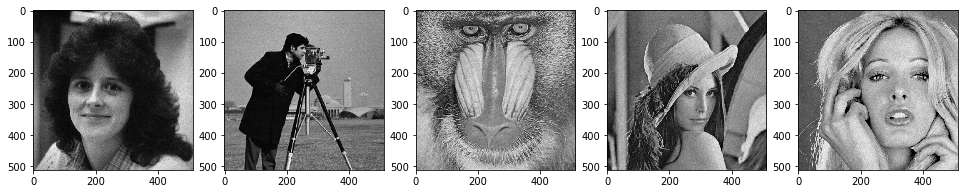

In [251]:
# Plotting images with Poisson Noise
plot_func(images_noise_P, saveimage=False, x=1, y=6)

estimated noise standard deviation = 11.302846670871773


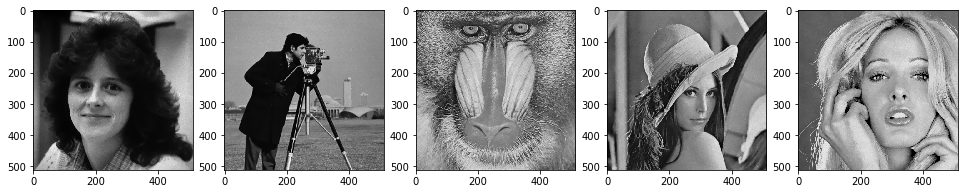

In [252]:
# Applying slow NLM to Poisson Noise images

patch = dict(patch_size=5, patch_distance=6, multichannel=True) # 5x5 patches # 13x13 search area
# estimate the noise standard deviation from the noisy image
sigma_est = np.mean(estimate_sigma(images_noise_P, multichannel=True))
print(f"estimated noise standard deviation = {sigma_est}")
images_filt_nlmP = np.zeros(images_noise_P.shape)

plt.figure(figsize = (20,3))
for i in range (len(images)):
    #x_noise_G[i] = img_as_float(x_noise_G[i])
    images_filt_nlmP[i] = denoise_nl_means(images_noise_P[i], h=1.15 * sigma_est, fast_mode=False, **patch)
    x = plt.subplot(1,6,i+1)
    plt.savefig("NLM Filter + Poisson Noise.png", bbox_inches = 'tight', format = 'png')
    plt.imshow(images_filt_nlmP[i], cmap = 'gray')

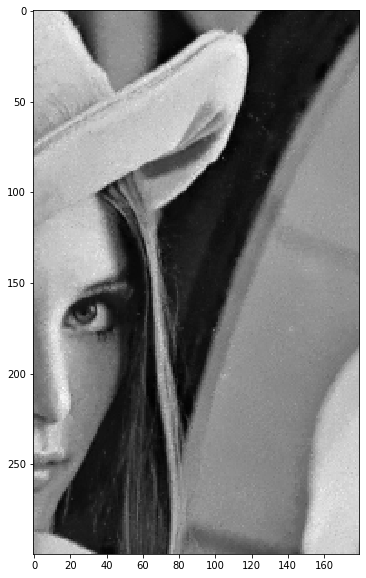

In [253]:
#Cropping Lena i = 3
x_filt_nlmP = images_filt_nlmP[3]
x_filt_nlmP = x_filt_nlmP[100:400, 300:480]
x_filt_nlmP.shape
x_filt_nlmP = np.array([x_filt_nlmP])
plot_func(x_filt_nlmP,saveimage=True,savename='lena_filt_nlmP_corpped.png',x=1,y=1, r=10, c=10)

In [254]:
# Evaluating performance of NLM filter on Poisson noise;

print('Performance of Median Filter in Gaussian Noise images -->')
ssim_nlmP = 0
ssim_nlmP_list = []
psnr_nlmP_list = []

for i in range (len(images)):
    ssim_nlmP = measure.compare_ssim(images_filt_nlmP[i], images[i])
    ssim_nlmP_list.append(ssim_nlmP)
    #ssim_wein +=ssim_wein
    #avg = ssim_wein/(len(x_img_5))   
    psnr_nlmP = measure.compare_psnr(images[i], images_filt_nlmP[i]) 
    psnr_nlmP_list.append(psnr_nlmP)
    print('For', i, 'image')
    print('SSIM: ',ssim_nlmP)
    print('PSNR: ', psnr_nlmP)

Performance of Median Filter in Gaussian Noise images -->
For 0 image
SSIM:  0.47838520792786327
PSNR:  6.251308226651355
For 1 image
SSIM:  0.3878652040029931
PSNR:  5.617138634940826


C:\Users\sahil\anaconda3\lib\site-packages\ipykernel_launcher.py:9: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  if __name__ == '__main__':
C:\Users\sahil\anaconda3\lib\site-packages\ipykernel_launcher.py:13: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
  del sys.path[0]


For 2 image
SSIM:  0.5884699592994582
PSNR:  5.537634089478848
For 3 image
SSIM:  0.49419137524733847
PSNR:  5.65238823173531
For 4 image
SSIM:  0.5129282590893492
PSNR:  5.100435885853968


## c) Filtering Salt and Pepper Noise 

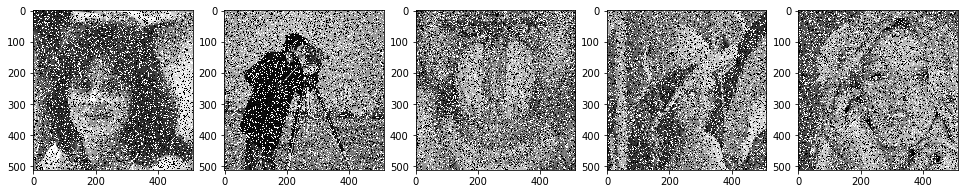

In [255]:
# Plotting images with Salt and Pepper Noise
plot_func(images_noise_SnP, saveimage=False,x=1 , y=6)

estimated noise standard deviation = 52.05499900585594


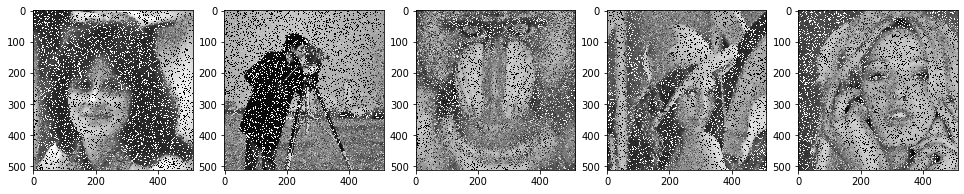

In [256]:
# Applying slow NLM to Salt and Pepper Noise images

patch = dict(patch_size=5, patch_distance=6, multichannel=True) # 5x5 patches # 13x13 search area
# estimate the noise standard deviation from the noisy image
sigma_est = np.mean(estimate_sigma(images_noise_SnP, multichannel=True))
print(f"estimated noise standard deviation = {sigma_est}")

images_filt_nlmSnP = np.zeros(images_noise_SnP.shape)

#plt.figure(figsize = (20,3))
for i in range (len(images)):
    images_filt_nlmSnP[i] = denoise_nl_means(images_noise_SnP[i], h=1.15 * sigma_est, fast_mode=False, **patch)
plot_func(images_filt_nlmSnP, saveimage=True, savename='NLMFilter-saltnpepper.png', x=1, y=6)

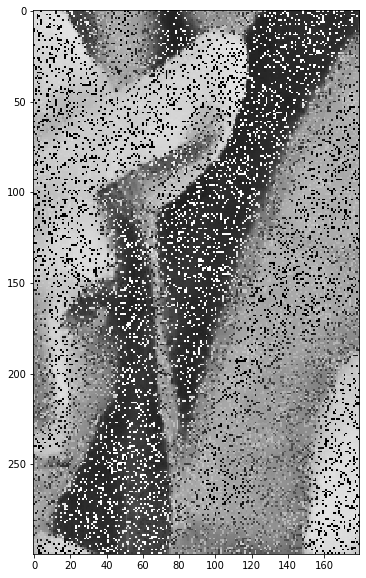

In [257]:
#Cropping Lena i = 3
x_filt_nlmSnP = images_filt_nlmSnP[3]
x_filt_nlmSnP = x_filt_nlmSnP[100:400, 300:480]
x_filt_nlmSnP.shape
x_filt_nlmSnP = np.array([x_filt_nlmSnP])
plot_func(x_filt_nlmSnP,saveimage=True,savename='lena_filt_nlmSnP_corpped.png',x=1,y=1, r=10, c=10)

In [258]:
# Evaluating performance of NLM filter on Salt and Ppper noise;

print('Performance of Median Filter in Gaussian Noise images -->')
ssim_nlmSnP = 0
ssim_nlmSnP_list = []
psnr_nlmSnP_list = []
for i in range (len(images)):
    ssim_nlmSnP = measure.compare_ssim(images_filt_nlmSnP[i], images[i])
    ssim_nlmSnP_list.append(ssim_nlmSnP)
    #ssim_wein +=ssim_wein
    #avg = ssim_wein/(len(x_img_5))   
    psnr_nlmSnP = measure.compare_psnr(images[i], images_filt_nlmSnP[i]) 
    psnr_nlmSnP_list.append(psnr_nlmSnP)
    print('For', i, 'image')
    print('SSIM: ',ssim_nlmSnP)
    print('PSNR: ', psnr_nlmSnP)

Performance of Median Filter in Gaussian Noise images -->
For 0 image
SSIM:  0.03324701509142131
PSNR:  11.27107142959986
For

C:\Users\sahil\anaconda3\lib\site-packages\ipykernel_launcher.py:8: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  
C:\Users\sahil\anaconda3\lib\site-packages\ipykernel_launcher.py:12: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
  if sys.path[0] == '':


 1 image
SSIM:  0.07032580163950934
PSNR:  11.772442049848433
For 2 image
SSIM:  0.14194744021294514
PSNR:  13.97637025301785
For 3 image
SSIM:  0.0688566533115396
PSNR:  12.843525913022592
For 4 image
SSIM:  0.08005186966463264
PSNR:  12.969841043420677


# Plotting SSIM and PSNR

In [273]:
# Finding average of SSIM and PSNR

ssim_weiner = [ np.sum(ssim_weinG_list)/len(ssim_weinG_list) , np.sum(ssim_weinP_list)/len(ssim_weinP_list), 
              np.sum(ssim_weinSnP_list)/len(ssim_weinSnP_list)]

psnr_weiner = [ np.sum(psnr_weinG_list)/len(psnr_weinG_list) , np.sum(psnr_weinP_list)/len(psnr_weinP_list), 
              np.sum(psnr_weinSnP_list)/len(psnr_weinSnP_list)]


ssim_bil = [ np.sum(ssim_bilG_list)/len(ssim_bilG_list) , np.sum(ssim_bilP_list)/len(ssim_bilP_list), 
              np.sum(ssim_bilSnP_list)/len(ssim_bilSnP_list)]

psnr_bil = [ np.sum(psnr_bilG_list)/len(psnr_bilG_list) , np.sum(psnr_bilP_list)/len(psnr_bilP_list), 
              np.sum(psnr_bilSnP_list)/len(psnr_bilSnP_list)]


ssim_med = [ np.sum(ssim_medG_list)/len(ssim_medG_list) , np.sum(ssim_medP_list)/len(ssim_medP_list), 
              np.sum(ssim_medSnP_list)/len(ssim_medSnP_list)]

psnr_med = [ np.sum(psnr_medG_list)/len(psnr_medG_list) , np.sum(psnr_medP_list)/len(psnr_medP_list), 
              np.sum(psnr_medSnP_list)/len(psnr_medSnP_list)]


ssim_nlm = [ np.sum(ssim_nlmG_list)/len(ssim_nlmG_list) , np.sum(ssim_nlmP_list)/len(ssim_nlmP_list), 
              np.sum(ssim_nlmSnP_list)/len(ssim_nlmSnP_list)]

psnr_nlm = [ np.sum(psnr_nlmG_list)/len(psnr_nlmG_list) , np.sum(psnr_nlmP_list)/len(psnr_nlmP_list), 
              np.sum(psnr_nlmSnP_list)/len(psnr_nlmSnP_list)]


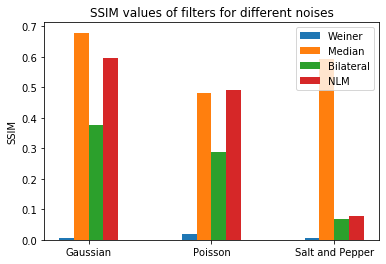

In [280]:
# creating ssim bar plot
labels = ['Gaussian', 'Poisson', 'Salt and Pepper']


x = np.arange(len(labels))  # the label locations
width = 0.12  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/(2/3), ssim_weiner, width, label='Weiner')
rects2 = ax.bar(x - width/2, ssim_med, width, label='Median')
rects3 = ax.bar(x + width/2, ssim_bil, width, label='Bilateral')
rects4 = ax.bar(x + width/(2/3), ssim_nlm, width, label='NLM')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('SSIM')
ax.set_title('SSIM values of filters for different noises')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()
plt.savefig('SSIM-vs-noise-perfilter.png', format='png',bbox='tight',dpi=300)

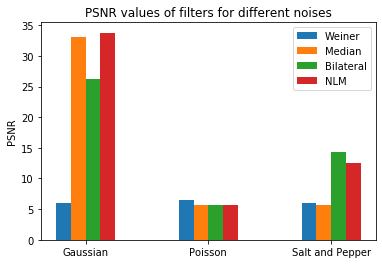

In [281]:
# Creating PSNR plots
labels = ['Gaussian', 'Poisson', 'Salt and Pepper']

fig1, ax1 = plt.subplots()

rects1 = ax1.bar(x - width/(2/3), psnr_weiner, width, label='Weiner')
rects2 = ax1.bar(x - width/2, psnr_med, width, label='Median')
rects3 = ax1.bar(x + width/2, psnr_bil, width, label='Bilateral')
rects4 = ax1.bar(x + width/(2/3), psnr_nlm, width, label='NLM')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax1.set_ylabel('PSNR')
ax1.set_title('PSNR values of filters for different noises')
ax1.set_xticks(x)
ax1.set_xticklabels(labels)
ax1.legend()
plt.savefig('PSNR-vs-noise-perfilter.png', format='png',bbox='tight',dpi=300)

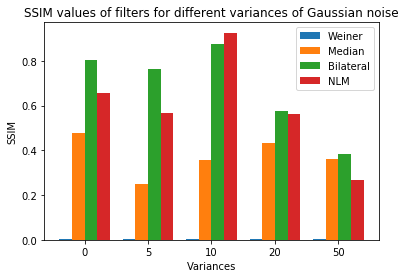

In [282]:
# Graph for gaussian noise with different variance
variances = [0, 5, 10, 20, 50] 

fig2, ax2 = plt.subplots()
width = 0.20
x = np.arange(len(variances))

rects1 = ax2.bar(x - width/(2/3), ssim_weinG_list, width, label='Weiner')
rects2 = ax2.bar(x - width/2, ssim_bilG_list, width, label='Median')
rects3 = ax2.bar(x + width/2, ssim_medG_list, width, label='Bilateral')
rects4 = ax2.bar(x + width/(2/3), ssim_nlmG_list, width, label='NLM')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax2.set_ylabel('SSIM')
ax2.set_xlabel('Variances')
ax2.set_title('SSIM values of filters for different variances of Gaussian noise')
ax2.set_xticks(x)
ax2.set_xticklabels(variances)
ax2.legend()
plt.savefig('SSIM-vs-Gauss-variances-perfilter.png', format='png',bbox='tight',dpi=300)

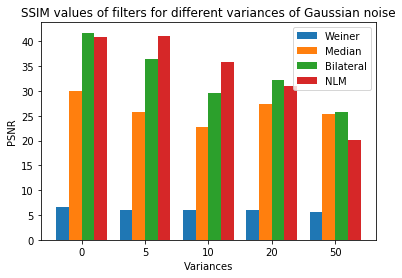

In [283]:
# Graph for gaussian noise with different variance
variances = [0, 5, 10, 20, 50] 

fig3, ax3 = plt.subplots()
width = 0.20
x = np.arange(len(variances))

rects1 = ax3.bar(x - width/(2/3), psnr_weinG_list, width, label='Weiner')
rects2 = ax3.bar(x - width/2, psnr_bilG_list, width, label='Median')
rects3 = ax3.bar(x + width/2, psnr_medG_list, width, label='Bilateral')
rects4 = ax3.bar(x + width/(2/3), psnr_nlmG_list, width, label='NLM')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax3.set_ylabel('PSNR')
ax3.set_xlabel('Variances')
ax3.set_title('SSIM values of filters for different variances of Gaussian noise')
ax3.set_xticks(x)
ax3.set_xticklabels(variances)
ax3.legend()
plt.savefig('PSNR-vs-Gauss-variances-perfilter.png', format='png',bbox='tight',dpi=300)